## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* **Use color transforms, gradients, etc., to create a thresholded binary image.**
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import pickle
def load_data_from_file(filePath, colnames):
    with open(filePath, mode='rb') as f:
        file = pickle.load(f)
    rtn = tuple(map(lambda x:file[x],colnames))
    return rtn

In [3]:
mtx, dist = load_data_from_file('./camera_calibration.p',['mtx','dist'])

In [4]:
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    sobel = cv2.Sobel(gray,cv2.CV_64F,orient=='x',orient=='y',ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel > thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sobel_binary

def mag_sobel_thresh(gray, sobel_kernel=3, thresh=(0, 255)):
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel > thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return mag_binary

def dir_sobel_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    dir = np.arctan2(abs_sobely,abs_sobelx)
    dir_binary = np.zeros_like(dir)
    dir_binary[(dir > thresh[0]) & (dir <= thresh[1])] = 1
    return dir_binary

In [5]:
def thresh_image(img, thresh=(20, 100)):
    binary = np.zeros_like(img)
    binary[((img > thresh[0]) & (img <= thresh[1]))] = 1
    return binary

In [115]:
import matplotlib.image as mpimg

def pipeline(image_files_set, ksize=5, s_thresh=(80, 250), sobelx_thresh=(20, 100)):
    
    image_set = []
    combined_set = []
    sbinary_set = []
    sxbinary_set = []
    
    for image_file_path in image_files_set:
        img = mpimg.imread(image_file_path)
        
        # Undistort
        img = cv2.undistort(img, mtx, dist, None, mtx)
        
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)

        h_channel = hls[:, :, 0]
#         l_channel = hls[:, :, 1]
        s_channel = hls[:, :, 2]
        
        s_binary = thresh_image(s_channel,thresh=s_thresh)
        sx_binary = abs_sobel_thresh(gray, orient='x', sobel_kernel=ksize, thresh=sobelx_thresh)
        
        h_binary = thresh_image(h_channel,thresh=(5,100))
        dir_binary = dir_sobel_threshold(gray,sobel_kernel=ksize,thresh=(0.7,1.3))
        mag_binary = mag_sobel_thresh(gray, sobel_kernel=ksize, thresh=(30, 100))
        
        combined_binary = np.zeros_like(gray)
#         combined_binary[(s_binary == 1) | (sx_binary == 1)] = 1
        combined_binary[((s_binary == 1) & (h_binary == 1)) | (sx_binary == 1)] = 1
        
#         combined_binary[((s_binary == 1) & (sx_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

        # perspective transform
        w,h = img.shape[1::-1]
        src = get_region_of_interest()
        dst = get_transform_dest(w,h)
        M = get_transform_matrix(src,dst)
        combined_binary = perspective_transform(combined_binary,M)
        
        image_set.append(img)
        combined_set.append(combined_binary)
#         sbinary_set.append(s_binary)
#         sxbinary_set.append(sx_binary)

#         sbinary_set.append(dir_binary)
#         sxbinary_set.append(mag_binary)

        sbinary_set.append(s_binary)
        sxbinary_set.append(h_binary)


    return zip(image_set,combined_set,sbinary_set,sxbinary_set)

In [75]:
def show_image_set(image_files, dataset_zip, titles, col_per_row = 4):
    for file_name,item in zip(image_files,dataset_zip):
        img,c_bin,s_bin,sx_bin = item
        fig = plt.figure(figsize = (24, 6))
        fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.01, wspace = 0.01)
        
        pts = get_region_of_interest()
        img = add_region_of_interest_to_image(img,pts)

        plt.subplot(1,col_per_row,1)
        plt.imshow(img)
        plt.title(file_name,fontsize=20)
        plt.axis('off')

        plt.subplot(1,col_per_row,2)
        plt.imshow(c_bin,cmap='gray')
        plt.title(titles[1],fontsize=20)
        plt.axis('off')
        
        plt.subplot(1,col_per_row,3)
        plt.imshow(s_bin,cmap='gray')
        plt.title(titles[2],fontsize=20)
        plt.axis('off')
        
        plt.subplot(1,col_per_row,4)
        plt.imshow(sx_bin,cmap='gray')
        plt.title(titles[3],fontsize=20)
        plt.axis('off')

In [8]:
def get_region_of_interest():
#     bottomY = 720
#     topY = 520
#     left1 = (60, bottomY)
#     left2 = (280, topY)
#     right1 = (905, topY)
#     right2 = (1200, bottomY)

    bottomY = 720
    topY = 455
    left1 = (190, bottomY)
    left2 = (585, topY)
    right1 = (705, topY)
    right2 = (1130, bottomY)
    
    return np.float32((left2,right1,right2,left1))    

In [9]:
def get_transform_dest(w,h):
#     dst = np.float32([[0,0],[w,0],[w,h],[0,h]])
    offset = 250
    dst = np.float32([[offset, 0],[w-offset, 0],[w-offset, h], [offset, h]])
    return dst

In [10]:
def get_transform_matrix(src_pts,dest_pts):
    M = cv2.getPerspectiveTransform(src_pts, dest_pts)    
    return M

In [11]:
def perspective_transform(img, M):
    w,h = img.shape[1::-1]
    transed = cv2.warpPerspective(img,M,(w,h),flags=cv2.INTER_LINEAR) 
    return transed

In [12]:
def add_region_of_interest_to_image(src_image,pts):
    left2 = pts[0]
    right1 = pts[1]
    right2 = pts[2]
    left1 = pts[3]

    color = [255, 0, 0]
    w = 2
    output = src_image.copy()
    cv2.line(output, tuple(left1), tuple(left2), color, w)
    cv2.line(output, tuple(left2), tuple(right1), color, w)
    cv2.line(output, tuple(right1), tuple(right2), color, w)
    cv2.line(output, tuple(right2), tuple(left1), color, w)
    
    return output

In [13]:
import matplotlib.image as mpimg

sample_image = mpimg.imread('./test_images/straight_lines2.jpg')

w,h = sample_image.shape[1::-1]
src = get_region_of_interest()
dst = get_transform_dest(w,h)

M = get_transform_matrix(src,dst)
inverseM = get_transform_matrix(dst,src)

import pickle
pickle.dump( { 'M': M, 'inverseM': inverseM }, open('./transform.p', 'wb'))

In [ ]:
print(M)
print(inverseM)

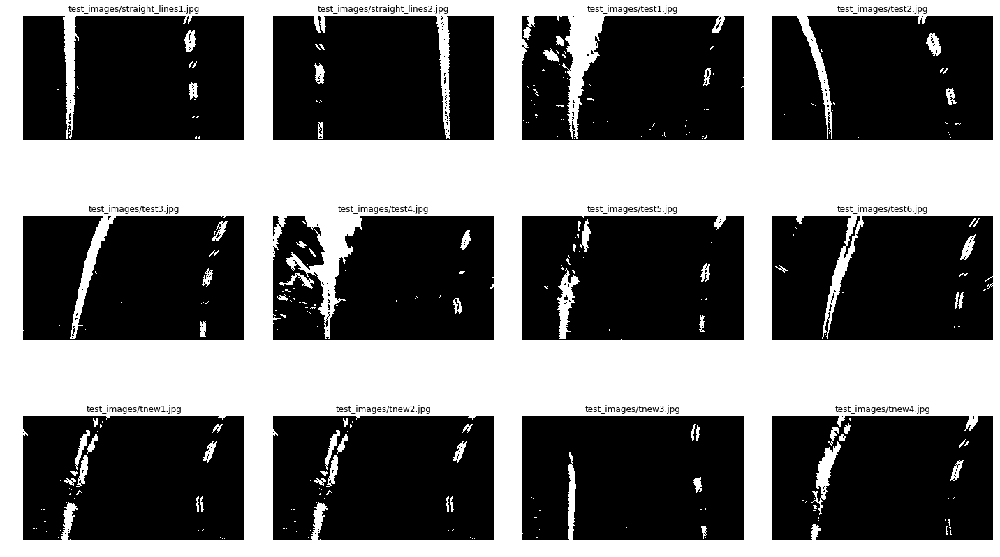

In [117]:
import glob

titles = ['Original','Transformed','S Channel','H Channel']

image_files_names = glob.glob('test_images/*.jpg')
# image_files_names = glob.glob('harder_test/*.jpg')

# img_set,c_set,s_set,sx_set = pipeline(image_files_names,ksize=3, s_thresh=(180, 250), sobelx_thresh=(30, 150))
# show_image_set(image_files_names,img_set,c_set,s_set,sx_set,titles)

dataset_zip = pipeline(image_files_names,ksize=3, s_thresh=(80, 250), sobelx_thresh=(30, 150))
# show_image_set(image_files_names,dataset_zip,titles)

image_set = []
combined_set = []
sbinary_set = []
sxbinary_set = []

for img,c_bin,s_bin,sx_bin in dataset_zip:
    image_set.append(img)
    combined_set.append(c_bin)
    sbinary_set.append(s_bin)
    sxbinary_set.append(sx_bin)

show_images(combined_set,image_files_names,cmap='gray')

# for ind in range(len(combined_set)):
#     mpimg.imsave('./{}.jpg'.format(ind+1),combined_set[ind])

# test1_set = combined_set
# index = 0
# showi = test1_set[index]*255
# mpimg.imsave('./1.jpg',test1_set[])
# mpimg.imsave('./2.jpg',test1_set[5])
# mpimg.imsave('./3.jpg',showi)
# mpimg.imsave('./4.jpg',test1_set[7])

# w,h = showi.shape[1::-1]
# src = get_region_of_interest()
# dst = get_transform_dest(w,h)
# M = get_transform_matrix(src,dst)

# showi_trans = perspective_transform(showi,M)

# plt.imshow(showi,cmap='gray')


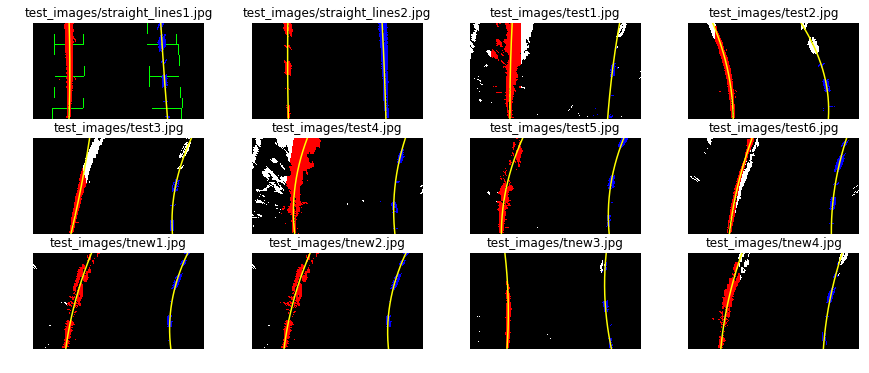

In [118]:
# show_images(combined_set)
# print(image_files_names)
imagesPoly = showLaneOnImages(combined_set,image_files_names,cols=4,rows=3,figsize=(15,6))

In [119]:
def calculateCurvature(yRange, left_fit_cr):
    """
    Returns the curvature of the polynomial `fit` on the y range `yRange`.
    """
    
    return ((1 + (2*left_fit_cr[0]*yRange*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])

yRange = 719

for imagePoly in imagesPoly:
    imagePath, left_fit, right_fit, left_fit_m, right_fit_m = imagePoly
    leftCurvature = calculateCurvature(yRange, left_fit_m) / 1000
    rightCurvature = calculateCurvature(yRange, right_fit_m) / 1000
    print('Image : {}, Left : {:.2f} km, Right : {:.2f} km'.format(imagePath, leftCurvature, rightCurvature))

Image : test_images/straight_lines1.jpg, Left : 3.74 km, Right : 10.48 km
Image : test_images/straight_lines2.jpg, Left : 6.02 km, Right : 8.51 km
Image : test_images/test1.jpg, Left : 4.23 km, Right : 2.32 km
Image : test_images/test2.jpg, Left : 0.58 km, Right : 0.34 km
Image : test_images/test3.jpg, Left : 2.72 km, Right : 0.44 km
Image : test_images/test4.jpg, Left : 0.48 km, Right : 0.55 km
Image : test_images/test5.jpg, Left : 0.53 km, Right : 0.48 km
Image : test_images/test6.jpg, Left : 0.95 km, Right : 0.71 km
Image : test_images/tnew1.jpg, Left : 0.87 km, Right : 0.39 km
Image : test_images/tnew2.jpg, Left : 0.78 km, Right : 0.42 km
Image : test_images/tnew3.jpg, Left : 1.27 km, Right : 0.75 km
Image : test_images/tnew4.jpg, Left : 0.90 km, Right : 0.91 km


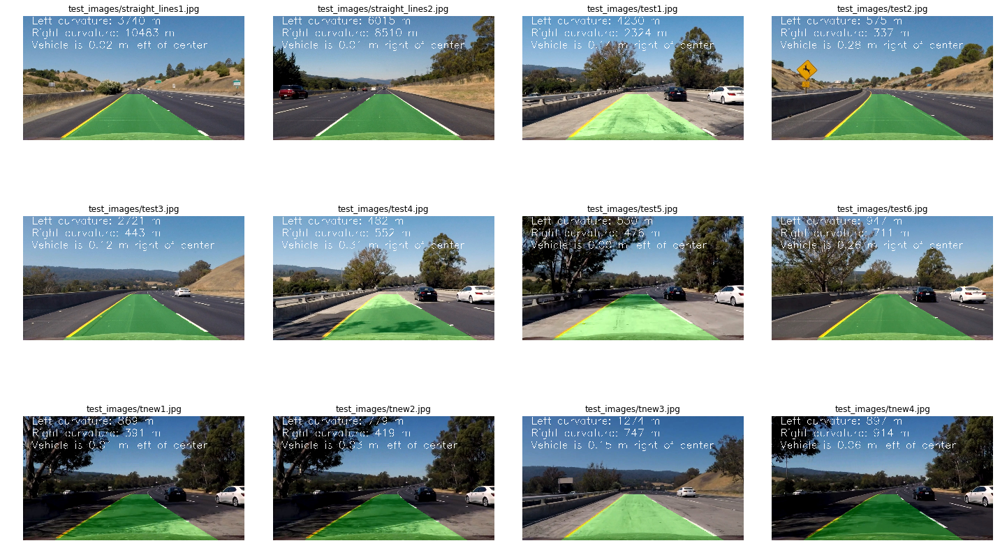

In [120]:
lanes_set = []
for image_fit,img in zip(imagesPoly,image_set):
    image_path, left_fit, right_fit, left_fit_m, right_fit_m = image_fit
    image_with_lane = drawLaneOnImage(img,left_fit,right_fit)
    image_with_lane = draw_lane_info_on_image(image_with_lane,left_fit_m,right_fit_m)
    lanes_set.append(image_with_lane)

show_images(lanes_set,image_files_names)
# plt.imshow(lanes_set[0])
# mpimg.imsave('./l1.jpg',lanes_set[0])

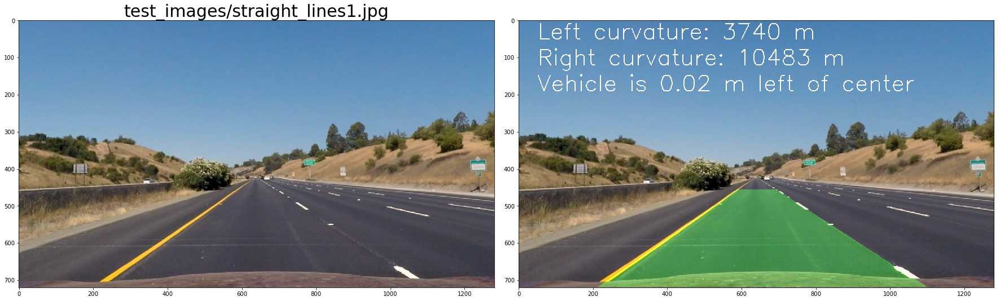

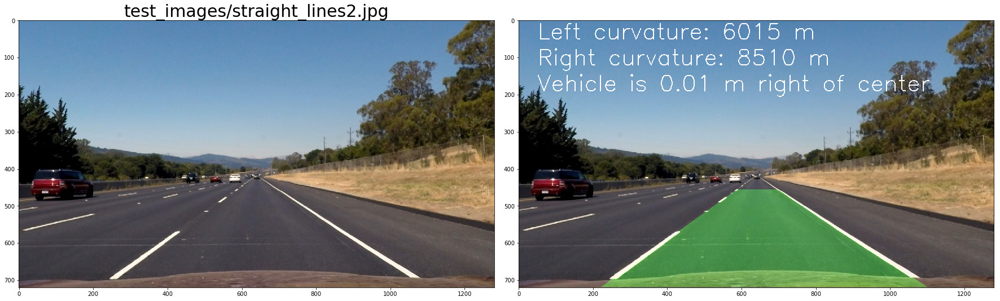

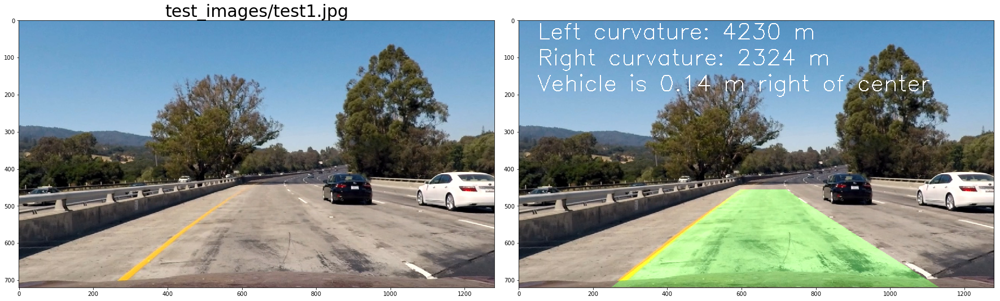

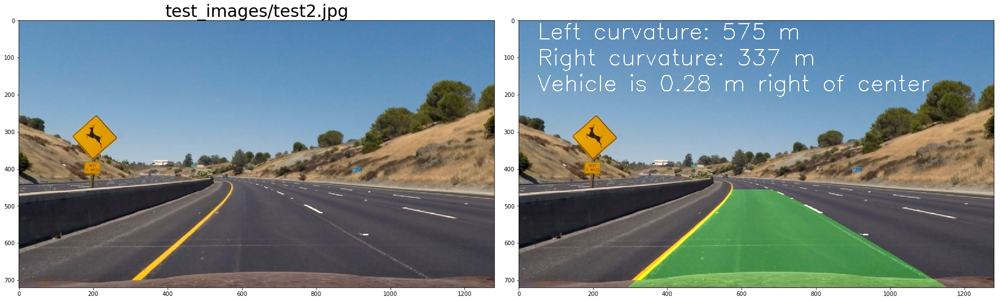

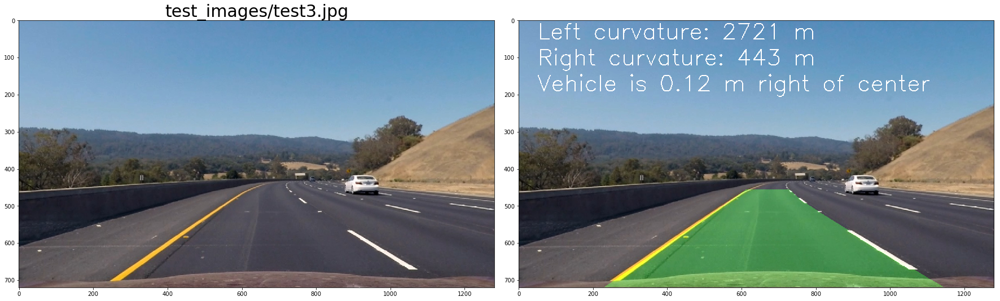

...

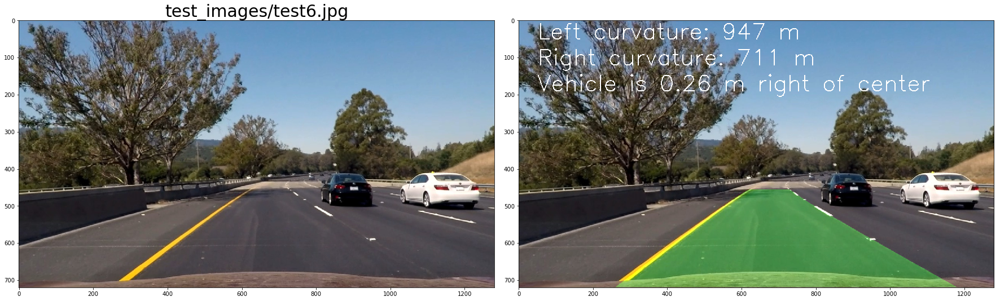

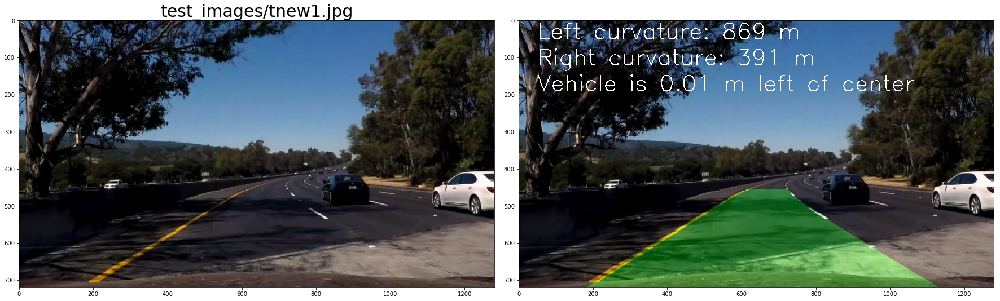

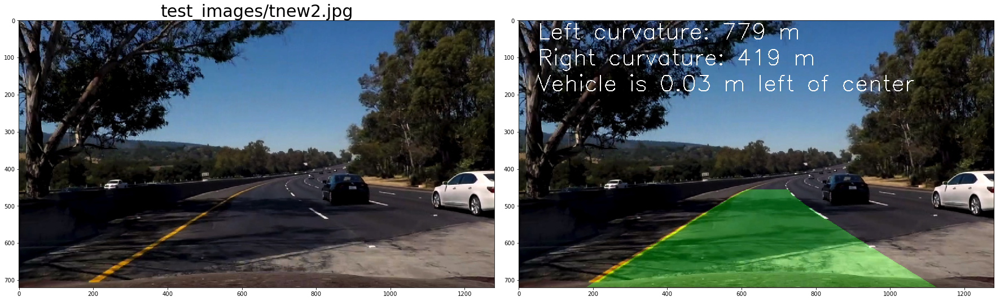

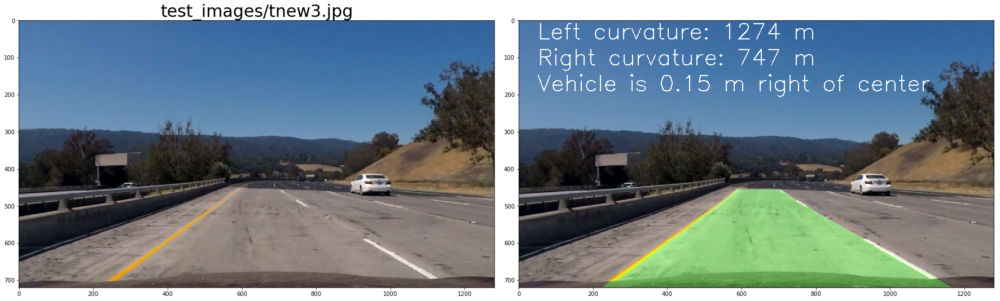

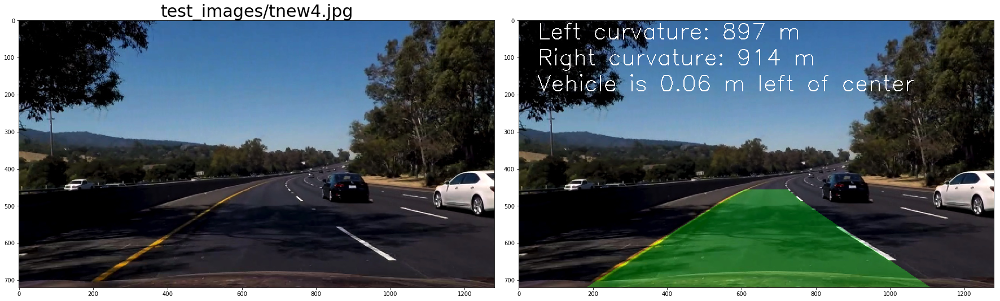

In [121]:
for org,lane,name in zip(image_set,lanes_set,image_files_names):
    show_2_images(org,lane,name,'')

In [20]:
def drawLine(img, left_fit, right_fit):
    """
    Draw the lane lines on the image `img` using the poly `left_fit` and `right_fit`.
    """
    yMax = img.shape[0]
    ploty = np.linspace(0, yMax - 1, yMax)
    color_warp = np.zeros_like(img).astype(np.uint8)
    
    # Calculate points.
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (inverseM)
    newwarp = cv2.warpPerspective(color_warp, inverseM, (img.shape[1], img.shape[0])) 
    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)

def drawLaneOnImage(img,l_fit,r_fit):
    """
    Find and draw the lane lines on the image `img`.
    """
#     left_fit, right_fit, left_fit_m, right_fit_m, _, _, _, _, _ = findLines(img)
    output = drawLine(img, l_fit, r_fit)
    return output #cv2.cvtColor( output, cv2.COLOR_BGR2RGB )

def draw_lane_info_on_image(img, l_fit_m, r_fit_m,fontScale=2):
    output = img.copy()
    # Calculate curvature
    leftCurvature = calculateCurvature(yRange, left_fit_m) 
    rightCurvature = calculateCurvature(yRange, right_fit_m)
    
    # Calculate vehicle center
    xMax = img.shape[1]*xm_per_pix
    yMax = img.shape[0]*ym_per_pix
    vehicleCenter = xMax / 2
    lineLeft = left_fit_m[0]*yMax**2 + left_fit_m[1]*yMax + left_fit_m[2]
    lineRight = right_fit_m[0]*yMax**2 + right_fit_m[1]*yMax + right_fit_m[2]
    lineMiddle = lineLeft + (lineRight - lineLeft)/2
    diffFromVehicle = lineMiddle - vehicleCenter
    if diffFromVehicle > 0:
        message = '{:.2f} m right'.format(diffFromVehicle)
    else:
        message = '{:.2f} m left'.format(-diffFromVehicle)
    
    # Draw info
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left curvature: {:.0f} m'.format(leftCurvature), (50, 50), font, fontScale, fontColor, 2)
    cv2.putText(output, 'Right curvature: {:.0f} m'.format(rightCurvature), (50, 120), font, fontScale, fontColor, 2)
    cv2.putText(output, 'Vehicle is {} of center'.format(message), (50, 190), font, fontScale, fontColor, 2)
    return output

In [38]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30 / 720  # meters per pixel in y dimension
xm_per_pix = 3.7 / 700  # meters per pixel in x dimension


def findLines(image, nwindows=9, margin=110, minpix=50, left_fit=None, right_fit=None):
     # Make a binary and transform image
    binary_warped = image
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    if (left_fit is None) | (right_fit is None):
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0] / 2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base

        # Set height of windows
        window_height = np.int(binary_warped.shape[0] // nwindows)

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window + 1) * window_height
            win_y_high = binary_warped.shape[0] - window * window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255, 0), 2)
            cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2)
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (
            nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (
            nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

    else:
        left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] - margin))
                          & (nonzerox < (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] + margin)))

        right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] - margin))
                           & (nonzerox < (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))


    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Fit a second order polynomial to each
    left_fit_m = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_m = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)

    return (left_fit, right_fit, left_fit_m, right_fit_m, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy)

def visualizeLanes(image, ax,lfit=None,rfit=None):
    """
    Visualize the windows and fitted lines for `image`.
    Returns (`left_fit` and `right_fit`)
    """
    left_fit, right_fit, left_fit_m, right_fit_m, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy = findLines(image,left_fit=lfit,right_fit=rfit)
    # Visualization
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    ax.imshow(out_img)
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')
    return ( left_fit, right_fit, left_fit_m, right_fit_m)

def showLaneOnImages(images, files,cols = 2, rows = 3, figsize=(15,13)):
    """
    Display `images` on a [`cols`, `rows`] subplot grid.
    Returns a collection with the image paths and the left and right polynomials.
    """
    imgLength = len(images)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    plt.axis('off')
    indexes = range(cols * rows)
    imageAndFit = []

    lfit = None
    rfit = None

    for ax, index in zip(axes.flat, indexes):
        if index < imgLength:
            image = images[index]
            imagePathName = files[index]
            left_fit, right_fit, left_fit_m, right_fit_m = visualizeLanes(image, ax,lfit=lfit,rfit=rfit)
            lfit = left_fit
            rfit = right_fit
            ax.set_title(imagePathName)
            ax.axis('off')
            imageAndFit.append( ( imagePathName, left_fit, right_fit, left_fit_m, right_fit_m ) )
    return imageAndFit

In [22]:
def show_images(image_set, title_set=None,counts=None,cmap=None):
    num_image_toshow = len(image_set) if counts is None else counts
    plt.figure(1, figsize=(20, 36))
    for idx in range(num_image_toshow):
        plt.subplot(9,4, idx + 1)
        img = image_set[idx]
        if img.shape[0] >0:
            if cmap is 'gray':
                plt.imshow(img,cmap='gray')
            else:
                plt.imshow(img)
        if title_set is not None:
            s = '{}'.format(title_set[idx])
            plt.title(s)
        plt.axis('off')
        plt.tight_layout()

In [46]:
def show_2_images(img1, img2, title1='',title2=''):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(title1, fontsize=30)
    ax2.imshow(img2, cmap='gray')
    ax2.set_title(title2, fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Video Processing

In [ ]:
def single_image_pipeline():
    return

In [ ]:
from moviepy.editor import VideoFileClip

left_fit = None
right_fit = None

class Lane():
    def __init__(self):
        self.left_fit = None
        self.right_fit = None
        self.left_fit_m = None
        self.right_fit_m = None
        self.leftCurvature = None
        self.rightCurvature = None

def calculateLanes(img):
    """
    Calculates the lane on image `img`.
    """
    left_fit, right_fit, left_fit_m, right_fit_m, _, _, _, _, _ = findLines(img)
    # Calculate curvature
    leftCurvature = calculateCurvature(yRange, left_fit_m) 
    rightCurvature = calculateCurvature(yRange, right_fit_m)
    
    # Calculate vehicle center
    xMax = img.shape[1]*xm_per_pix
    yMax = img.shape[0]*ym_per_pix
    vehicleCenter = xMax / 2
    lineLeft = left_fit_m[0]*yMax**2 + left_fit_m[1]*yMax + left_fit_m[2]
    lineRight = right_fit_m[0]*yMax**2 + right_fit_m[1]*yMax + right_fit_m[2]
    lineMiddle = lineLeft + (lineRight - lineLeft)/2
    diffFromVehicle = lineMiddle - vehicleCenter
    
    return (left_fit, right_fit, left_fit_m, right_fit_m, leftCurvature, rightCurvature, diffFromVehicle)

def displayLanes(img, left_fit, right_fit, left_fit_m, right_fit_m, leftCurvature, rightCurvature, diffFromVehicle):
    """
    Display the lanes information on the image.
    """
    output = drawLine(img, left_fit, right_fit)
    
    if diffFromVehicle > 0:
        message = '{:.2f} m right'.format(diffFromVehicle)
    else:
        message = '{:.2f} m left'.format(-diffFromVehicle)
    
    # Draw info
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left curvature: {:.0f} m'.format(leftCurvature), (50, 50), font, 1, fontColor, 2)
    cv2.putText(output, 'Right curvature: {:.0f} m'.format(rightCurvature), (50, 120), font, 1, fontColor, 2)
    cv2.putText(output, 'Vehicle is {} of center'.format(message), (50, 190), font, 1, fontColor, 2)
    return output
    
def videoPipeline(inputVideo, outputVideo):
    """
    Process the `inputVideo` frame by frame to find the lane lines, draw curvarute and vehicle position information and
    generate `outputVideo`
    """
    myclip = VideoFileClip(inputVideo)
    
    leftLane = Lane()
    rightLane = Lane()
    
    def processImage(img):
        left_fit, right_fit, left_fit_m, right_fit_m, leftCurvature, rightCurvature, diffFromVehicle = calculateLanes(img)
        if leftCurvature > 10000:
            left_fit = leftLane.left_fit
            left_fit_m = leftLane.left_fit_m
            leftCurvature = leftLane.leftCurvature
        else:
            leftLane.left_fit = left_fit
            leftLane.left_fit_m = left_fit_m
            leftLane.leftCurvature = leftCurvature
        
        if rightCurvature > 10000:
            right_fit = rightLane.right_fit
            right_fit_m = rightLane.right_fit_m
            rightCurvature = rightLane.rightCurvature
        else:
            rightLane.right_fit = right_fit
            rightLane.right_fit_m = right_fit_m
            rightLane.rightCurvature = rightCurvature
            
        return displayLanes(img, left_fit, right_fit, left_fit_m, right_fit_m, leftCurvature, rightCurvature, diffFromVehicle)

    clip = myclip.fl_image(processImage)
    clip.write_videofile(outputVideo, audio=False)

# Project video
videoPipeline('project_video.mp4', 'out_project_video.mp4')

In [ ]:
def imageSideBySide(leftImg, leftTitle, rightImg, rightTitle, figsize=(20,10) , leftCmap=None, rightCmap=None):
    """
    Display the images `leftImg` and `rightImg` side by side with image titles.
    """
    fig, axes = plt.subplots(ncols=2, figsize=figsize)
    if leftCmap == None:
        axes[0].imshow(leftImg)
    else:
        axes[0].imshow(leftImg, cmap=leftCmap)
    axes[0].set_title(leftTitle)
    
    if rightCmap == None:
        axes[1].imshow(rightImg)
    else:
        axes[1].imshow(rightImg, cmap=rightCmap)
    axes[1].set_title(rightTitle)

In [ ]:
index = 32
undist = img_set[index]

xSize, ySize, _ = undist.shape
copy = undist.copy()

bottomY = 720
topY = 455


left1 = (190, bottomY)
left1_x, left1_y = left1
left2 = (585, topY)
left2_x, left2_y = left2

right1 = (705, topY)
right1_x, right1_y = right1

right2 = (1130, bottomY)
right2_x, right2_y = right2

color = [255, 0, 0]
w = 2
cv2.line(copy, left1, left2, color, w)
cv2.line(copy, left2, right1, color, w)
cv2.line(copy, right1, right2, color, w)
cv2.line(copy, right2, left1, color, w)
fig, ax = plt.subplots(figsize=(40, 20))
ax.imshow(copy)



In [ ]:
import matplotlib.image as mpimg

# image = mpimg.imread('./test_images/straight_lines2.jpg')
# image = mpimg.imread('./test_images/test4.jpg')
image = mpimg.imread('./harder_test/2-17.jpg')
# image = mpimg.imread('./harder_test/1-03.jpg')


gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)

h_channel = hls[:, :, 0]
l_channel = hls[:, :, 1]
s_channel = hls[:, :, 2]

# result = pipeline(image)

# Choose a Sobel kernel size
ksize = 5 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
h_binary = thresh_image(h_channel,thresh=(0,30))
l_binary = thresh_image(l_channel,thresh=(150,255))
s_binary = thresh_image(s_channel,thresh=(100,255))

# gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=ksize, thresh=(30, 100))
# grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=ksize, thresh=(30, 100))
# mag_binary = mag_sobel_thresh(gray, sobel_kernel=ksize, thresh=(70, 100))
# dir_binary = dir_sobel_threshold(gray, sobel_kernel=ksize, thresh=(0.7, 1.3))

combined1 = np.zeros_like(gray)
# combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
combined1[((s_binary == 1) | (l_binary == 1))] = 1
# combined[(h_binary > 0)] = 1

combined2 = np.zeros_like(gray)
combined2[((s_binary == 1) | (h_binary == 1))] = 1

combined3 = np.zeros_like(gray)
combined2[((combined1 == 1) & (combined2 == 1))] = 1

# plt.imshow(h_binary,cmap='gray')
# plt.imshow(l_binary,cmap='gray')
# plt.imshow(s_binary,cmap='gray')

show_2_images(image,h_binary,'Original','h_binary')
show_2_images(image,l_binary,'Original','l_binary')
show_2_images(image,s_binary,'Original','s_binary')
show_2_images(image,combined1,'Original','s+l')
show_2_images(image,combined2,'Original','s+h')
show_2_images(image,combined2,'Original','(s+l)*(s+h)')

# # plt.show()

# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(image)
# ax1.set_title('Original Image', fontsize=30)
# ax2.imshow(combined, cmap='gray')
# ax2.set_title('Combined', fontsize=30)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)